# Krishna Gupta

In [ ]:
import numpy as np
import cv2, math
from skimage.util import random_noise
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 15)

## 1)

In [ ]:
img = cv2.imread('checkerboard.png',0)

### a)

In [ ]:
# adding gaussian noise
gauss_img = random_noise(img, mode = 'gaussian')* 255.0
gauss_img = gauss_img.astype(np.uint8)

In [ ]:
# adding salt and pepper noise
salt_pp_img = random_noise(img, mode = 's&p')* 255.0
salt_pp_img = salt_pp_img.astype(np.uint8)

In [ ]:
# Function to add periodic noise to an image
def period_noise(image):
  M, N = image.shape[0], image.shape[1]
  noise = np.zeros((M,N), dtype='float64')
  X, Y = np.meshgrid(range(0, M), range(0, N))
  A, u0, v0 = 40, 45, 50
  noise += A*np.sin(X*u0 + Y*v0)
  A, u0, v0 = -18, -45, 50
  noise += A*np.sin(X*u0 + Y*v0)
  periodic_noise = img+noise
  return np.float32(periodic_noise)

In [ ]:
# adding periodic noise
period_img = period_noise(img)

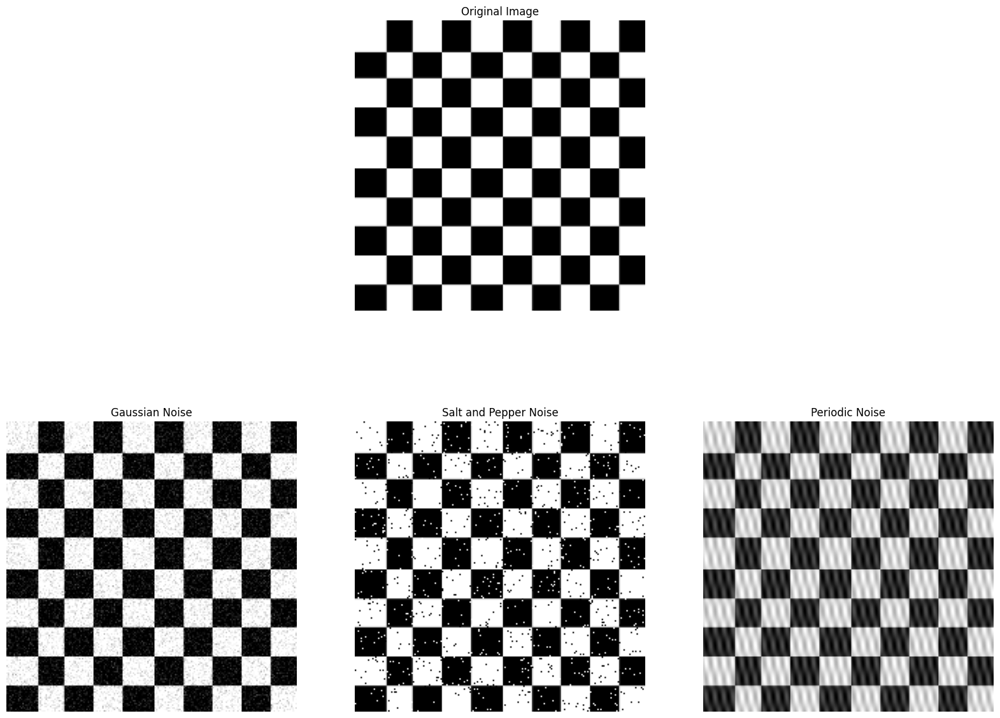

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 3, 2)
plt.imshow(img,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(gauss_img,cmap="gray")
plt.title("Gaussian Noise")
plt.axis('off')
fig.add_subplot(2,3,5)
plt.imshow(salt_pp_img,cmap="gray")
plt.title("Salt and Pepper Noise")
plt.axis('off')
fig.add_subplot(2,3,6)
plt.imshow(period_img,cmap="gray")
plt.title("Periodic Noise")
plt.axis('off')
plt.show()

### b)

In [ ]:
# Box flter of size 5x5
box = np.ones((5,5))/(5*5)

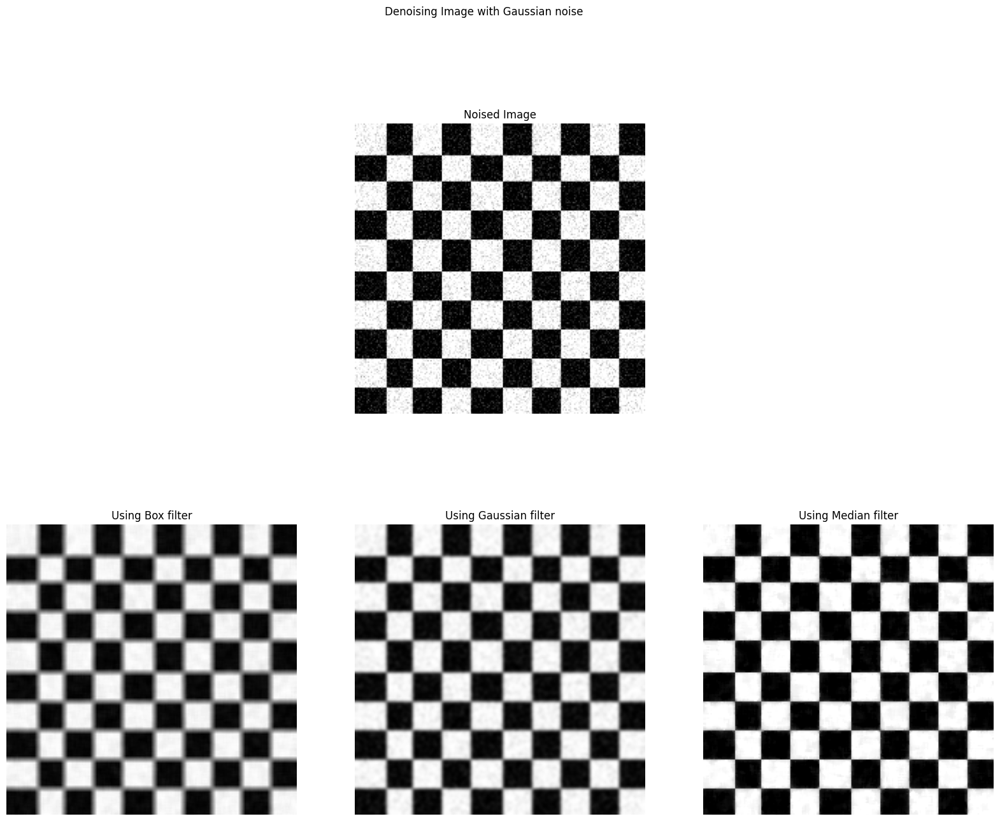

In [ ]:
# using different filters to denoise image with gaussian noise
fig=plt.figure()

fig.add_subplot(2, 3, 2)
plt.suptitle("Denoising Image with Gaussian noise")
plt.imshow(gauss_img,cmap="gray")
plt.title("Noised Image")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(cv2.filter2D(gauss_img, -1, box),cmap="gray")
plt.title("Using Box filter")
plt.axis('off')
fig.add_subplot(2,3,5)
plt.imshow(cv2.GaussianBlur(gauss_img, (5,5), 0),cmap="gray")
plt.title("Using Gaussian filter")
plt.axis('off')
fig.add_subplot(2,3,6)
plt.imshow(cv2.medianBlur(gauss_img, 5),cmap="gray")
plt.title("Using Median filter")
plt.axis('off')
plt.show()

Median filter performs the best in removing Gaussian noise from image.



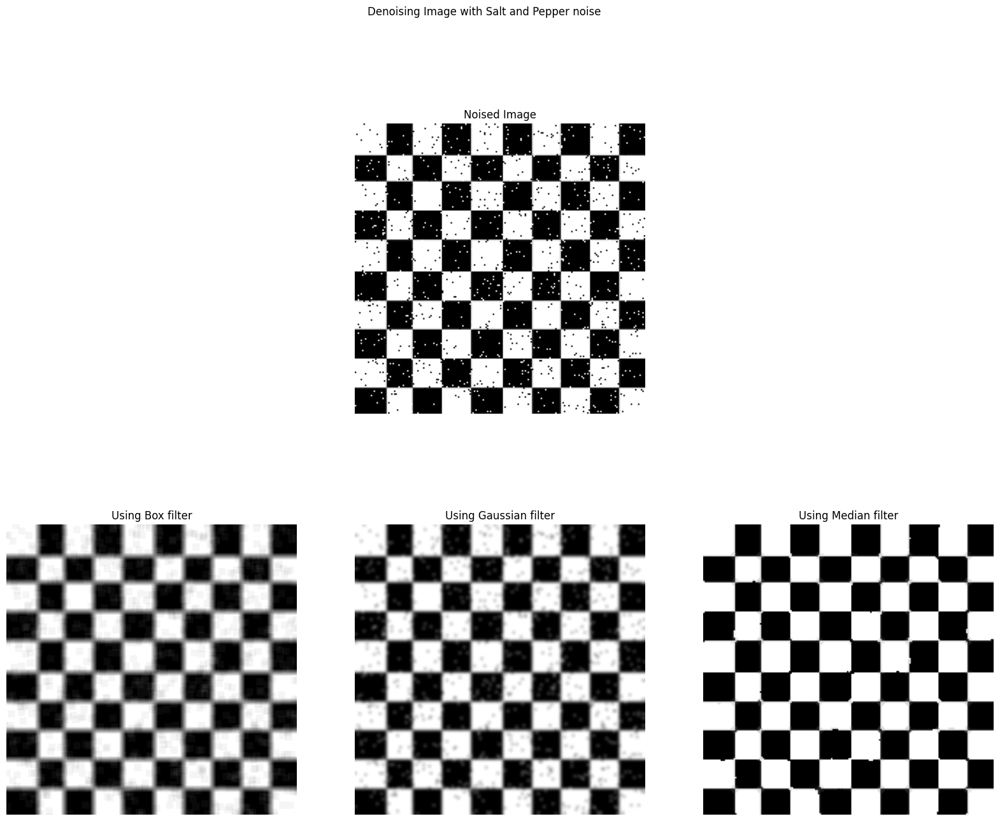

In [ ]:
# using different filters to denoise image with salt and pepper noise
fig=plt.figure()

fig.add_subplot(2, 3, 2)
plt.suptitle("Denoising Image with Salt and Pepper noise")
plt.imshow(salt_pp_img,cmap="gray")
plt.title("Noised Image")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(cv2.filter2D(salt_pp_img, -1, box),cmap="gray")
plt.title("Using Box filter")
plt.axis('off')
fig.add_subplot(2,3,5)
plt.imshow(cv2.GaussianBlur(salt_pp_img, (5,5), 0),cmap="gray")
plt.title("Using Gaussian filter")
plt.axis('off')
fig.add_subplot(2,3,6)
plt.imshow(cv2.medianBlur(salt_pp_img, 5),cmap="gray")
plt.title("Using Median filter")
plt.axis('off')
plt.show()

Median filter performs the best in removing salt and pepper noise from image.

In [ ]:
# Get f-shift
def get_fshift_and_save_dft(img):
  img = np.asarray(img)
  f = np.fft.fft2(img)
  fshift = np.fft.fftshift(f)
  dft = 20 * np.log(np.abs(fshift))
  dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
  dft_shift = np.fft.fftshift(dft)

  magnitude_spectrum, phase_spectrum = cv2.cartToPolar(dft_shift[:,:,0],dft_shift[:,:,1])
  magnitude_spectrum_new = 20*np.log(1 + magnitude_spectrum)
  result = np.where(magnitude_spectrum_new == np.amax(magnitude_spectrum_new))
  result  = magnitude_spectrum_new.argsort(axis=-1, kind=None, order=None)[-9:][::-1]
  
  points =[]
  for i in range(9):
    highest, high_index = -1, 0.1
    for ind_i,i in enumerate(magnitude_spectrum_new):
      for ind_j,j in enumerate(i):
        if j>highest and not((ind_i, ind_j) in points):
          highest= j
          high_index=(ind_i, ind_j)
    points.append(high_index)

  return points[1:]

In [ ]:
# Applying Ideal-Notch Filter
def ideal_notch(img):
  img = np.asarray(img)
  f = np.fft.fft2(img)
  fshift = np.fft.fftshift(f)
  dft, d0 = 20 * np.log(np.abs(fshift)), 0.5
  M, N  = fshift.shape
  
  points = get_fshift_and_save_dft(img.copy())
  for u in range(M):
    for v in range(N):
      for d in range(len(points)):
        u0, v0 = points[d][0], points[d][1]
        d1 = pow(pow(u - u0, 2) + pow(v - v0, 2), 1)
        d2 = pow(pow(u + u0, 2) + pow(v + v0, 2), 1)
        if d1 <= d0 or d2 <= d0:
          fshift[u][v] *= 0.0
  f_ishift = np.fft.ifftshift(fshift)
  return np.abs(np.fft.ifft2(f_ishift))

In [ ]:
# Applying Butterworth-Notch Filter
def butter_notch(img):
  img = np.asarray(img)
  f = np.fft.fft2(img)
  fshift = np.fft.fftshift(f)
  dft, d0, eps = 20 * np.log(np.abs(fshift)), 0.5, 0.000001
  points = get_fshift_and_save_dft(img.copy())
  
  M, N = fshift.shape
  for u in range(M):
    for v in range(N):
      for d in range(len(points)):
        u0, v0 = points[d][0], points[d][1]
        d1 = pow(pow(u - u0, 2) + pow(v - v0, 2), 0.5)
        d2 = pow(pow(u + u0, 2) + pow(v + v0, 2), 0.5) 
        fshift[u][v] *= (1.0 / (1 + pow((d0 * d0) / (d1 * d2 + eps), 1))) 
  f_ishift = np.fft.ifftshift(fshift)
  return np.abs(np.fft.ifft2(f_ishift))

In [ ]:
#defining the Gaussian notch filter
def gauss_notch(img):
  img = np.asarray(img)
  f = np.fft.fft2(img)
  fshift = np.fft.fftshift(f)
  dft, d0 = 20 * np.log(np.abs(fshift)), 0.5
  points = get_fshift_and_save_dft(img.copy())

  M, N = fshift.shape
  for u in range(M):
    for v in range(N):
      for d in range(len(points)):
        u0, v0 = points[d][0], points[d][1]
        d1 = pow(pow(u - u0, 2) + pow(v - v0, 2), 0.5)
        d2 = pow(pow(u + u0, 2) + pow(v + v0, 2), 0.5)
        fshift[u][v] *= (1 - math.exp(-0.5 * (d1 * d2 / pow(d0, 2))))

  f_ishift = np.fft.ifftshift(fshift)
  return np.abs(np.fft.ifft2(f_ishift))

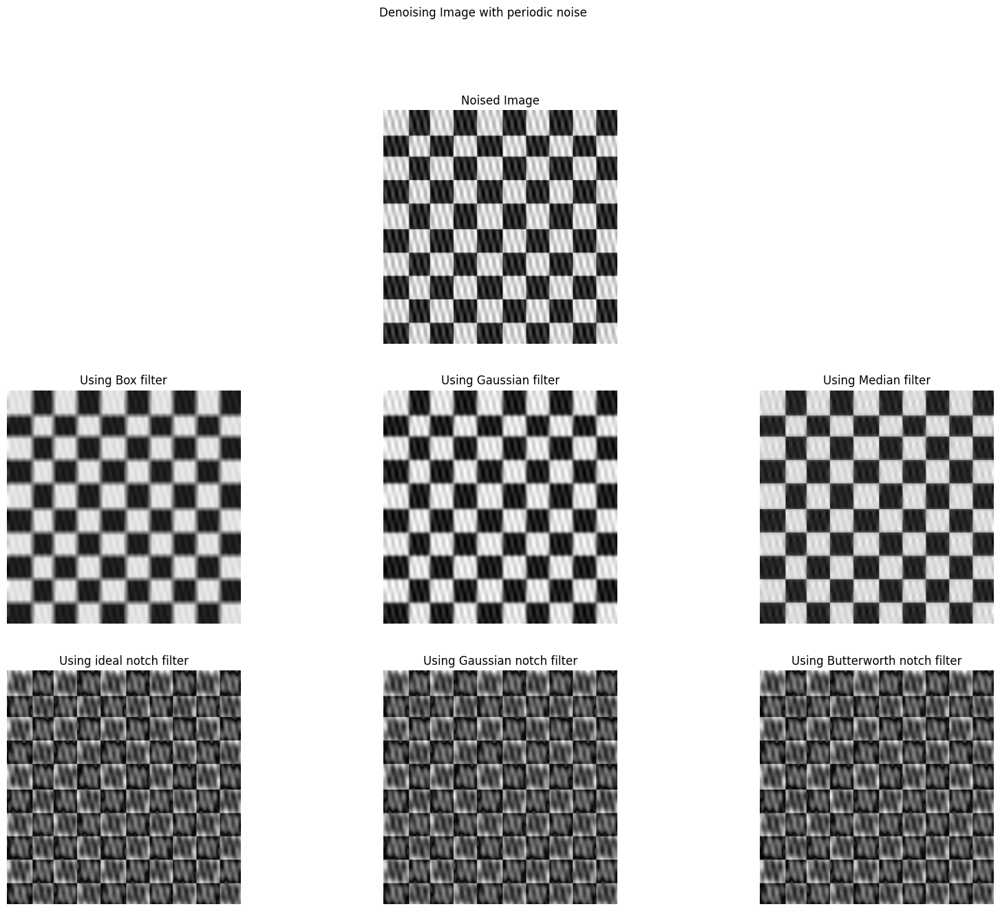

In [ ]:
# using different filters to denoise image with periodic noise
fig=plt.figure()

fig.add_subplot(3, 3, 2)
plt.suptitle("Denoising Image with periodic noise")
plt.imshow(period_img,cmap="gray")
plt.title("Noised Image")
plt.axis('off')
fig.add_subplot(3,3,4)
plt.imshow(cv2.filter2D(period_img, -1, box),cmap="gray")
plt.title("Using Box filter")
plt.axis('off')
fig.add_subplot(3,3,5)
plt.imshow(cv2.GaussianBlur(period_img, (5,5), 0),cmap="gray")
plt.title("Using Gaussian filter")
plt.axis('off')
fig.add_subplot(3,3,6)
plt.imshow(cv2.medianBlur(period_img, 5),cmap="gray")
plt.title("Using Median filter")
plt.axis('off')
fig.add_subplot(3,3,7)
plt.imshow(ideal_notch(period_img),cmap="gray")
plt.title("Using ideal notch filter")
plt.axis('off')
fig.add_subplot(3,3,8)
plt.imshow(gauss_notch(period_img),cmap="gray")
plt.title("Using Gaussian notch filter")
plt.axis('off')
fig.add_subplot(3,3,9)
plt.imshow(butter_notch(period_img),cmap="gray")
plt.title("Using Butterworth notch filter")
plt.axis('off')
plt.show()

Median filter removes periodic noise to a certain extent. However, notch filter are useless in removing periodic noise from image.

### c)

In [ ]:
img1=cv2.imread('notch1.jpg',0)
img2=cv2.imread('notch2.png',0)
img3=cv2.imread('notch3.jpg',0)

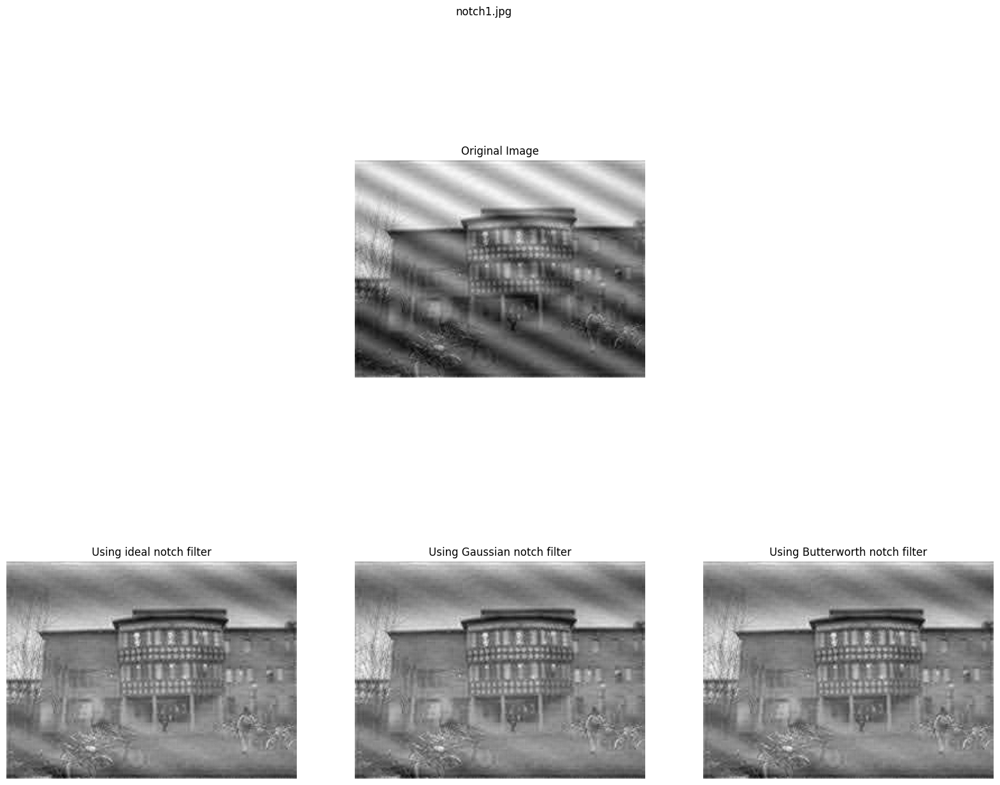

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 3, 2)
plt.suptitle("notch1.jpg")
plt.imshow(img1,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(ideal_notch(img1),cmap="gray")
plt.title("Using ideal notch filter")
plt.axis('off')
fig.add_subplot(2,3,5)
plt.imshow(gauss_notch(img1),cmap="gray")
plt.title("Using Gaussian notch filter")
plt.axis('off')
fig.add_subplot(2,3,6)
plt.imshow(butter_notch(img1),cmap="gray")
plt.title("Using Butterworth notch filter")
plt.axis('off')
plt.show()

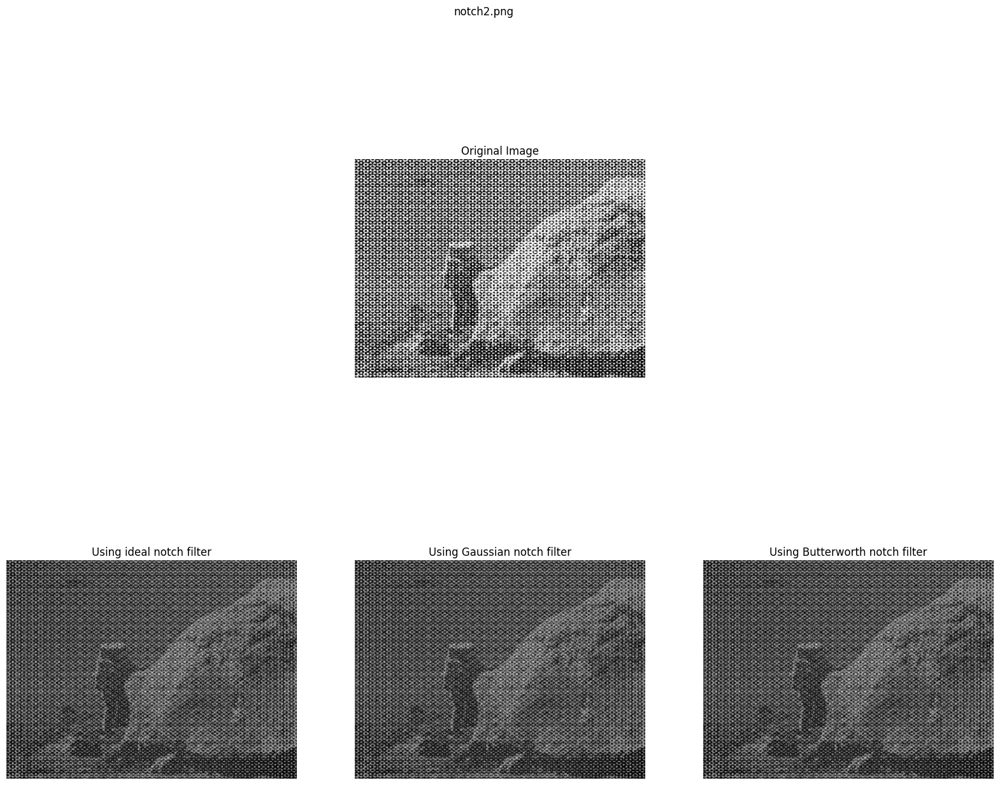

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 3, 2)
plt.suptitle("notch2.png")
plt.imshow(img2,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(ideal_notch(img2),cmap="gray")
plt.title("Using ideal notch filter")
plt.axis('off')
fig.add_subplot(2,3,5)
plt.imshow(gauss_notch(img2),cmap="gray")
plt.title("Using Gaussian notch filter")
plt.axis('off')
fig.add_subplot(2,3,6)
plt.imshow(butter_notch(img2),cmap="gray")
plt.title("Using Butterworth notch filter")
plt.axis('off')
plt.show()

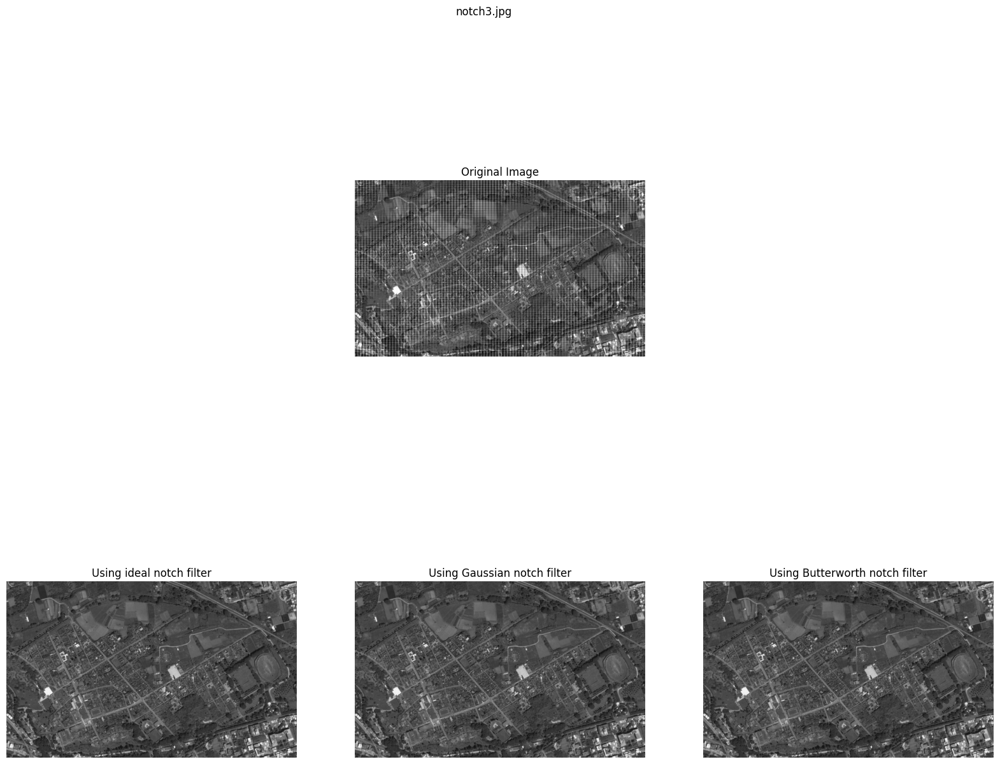

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 3, 2)
plt.suptitle("notch3.jpg")
plt.imshow(img3,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(ideal_notch(img3),cmap="gray")
plt.title("Using ideal notch filter")
plt.axis('off')
fig.add_subplot(2,3,5)
plt.imshow(gauss_notch(img3),cmap="gray")
plt.title("Using Gaussian notch filter")
plt.axis('off')
fig.add_subplot(2,3,6)
plt.imshow(butter_notch(img3),cmap="gray")
plt.title("Using Butterworth notch filter")
plt.axis('off')
plt.show()

From the above plots, we see that the three notch filters (Ideal, Gaussian and Butterworth) used here work pretty much same for all the three images. Also, for the first two images, the filters are not working satisfactorily in removing the periodic noise. But, for the 3rd image, they work significantly good in cleaning the noise.

## 2)

In [ ]:
fp_img1 = cv2.imread('fingerprint1.jpg', 0)
fp_img2 = cv2.imread('fingerprint2.jpg', 0)
bp_img = cv2.imread('bookpage.jpg', 0)

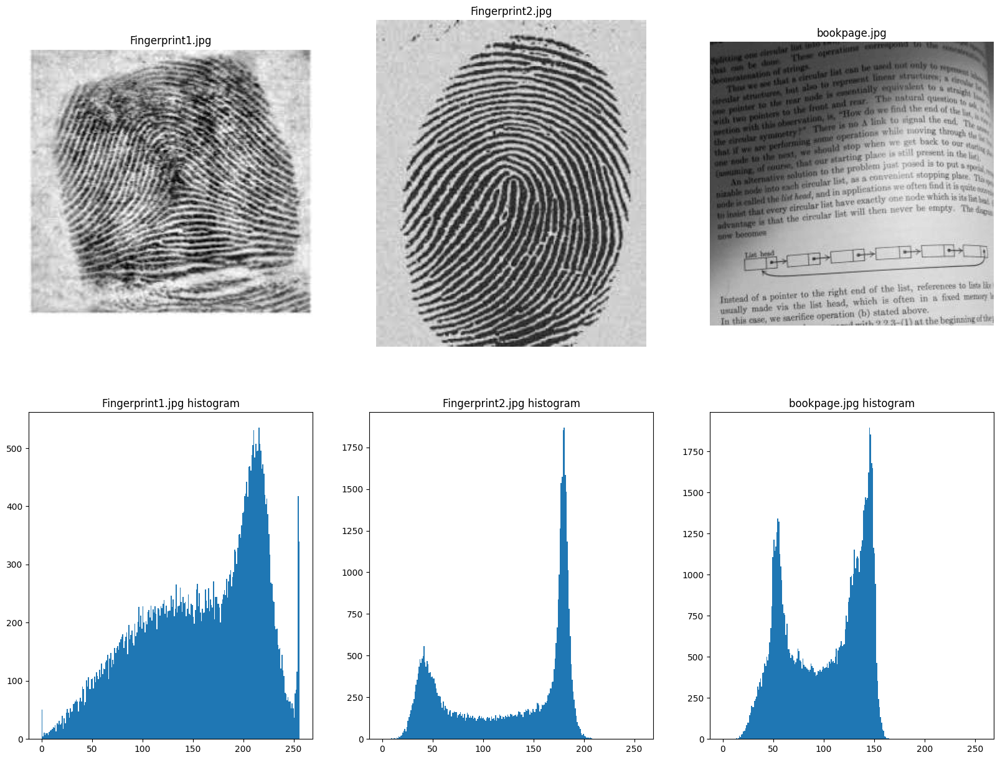

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 3, 1)
plt.imshow(fp_img1,cmap="gray")
plt.title("Fingerprint1.jpg")
plt.axis('off')
fig.add_subplot(2, 3, 2)
plt.imshow(fp_img2,cmap="gray")
plt.title("Fingerprint2.jpg")
plt.axis('off')
fig.add_subplot(2, 3, 3)
plt.imshow(bp_img,cmap="gray")
plt.title("bookpage.jpg")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.hist(fp_img1.ravel(), 256, [0,256])
plt.title("Fingerprint1.jpg histogram")
fig.add_subplot(2,3,5)
plt.hist(fp_img2.ravel(), 256, [0,256])
plt.title("Fingerprint2.jpg histogram")
fig.add_subplot(2,3,6)
plt.hist(bp_img.ravel(), 256, [0,256])
plt.title("bookpage.jpg histogram")
plt.show()

### a)

In [ ]:
def manual_thresh(img,t):
  thresh=[]
  for i in range(len(img)):
    thresh.append(cv2.threshold(img[i], t, 255, cv2.THRESH_BINARY)[1]) 
  return thresh

In [ ]:
img_thresh=manual_thresh([fp_img1,fp_img2,bp_img],128)

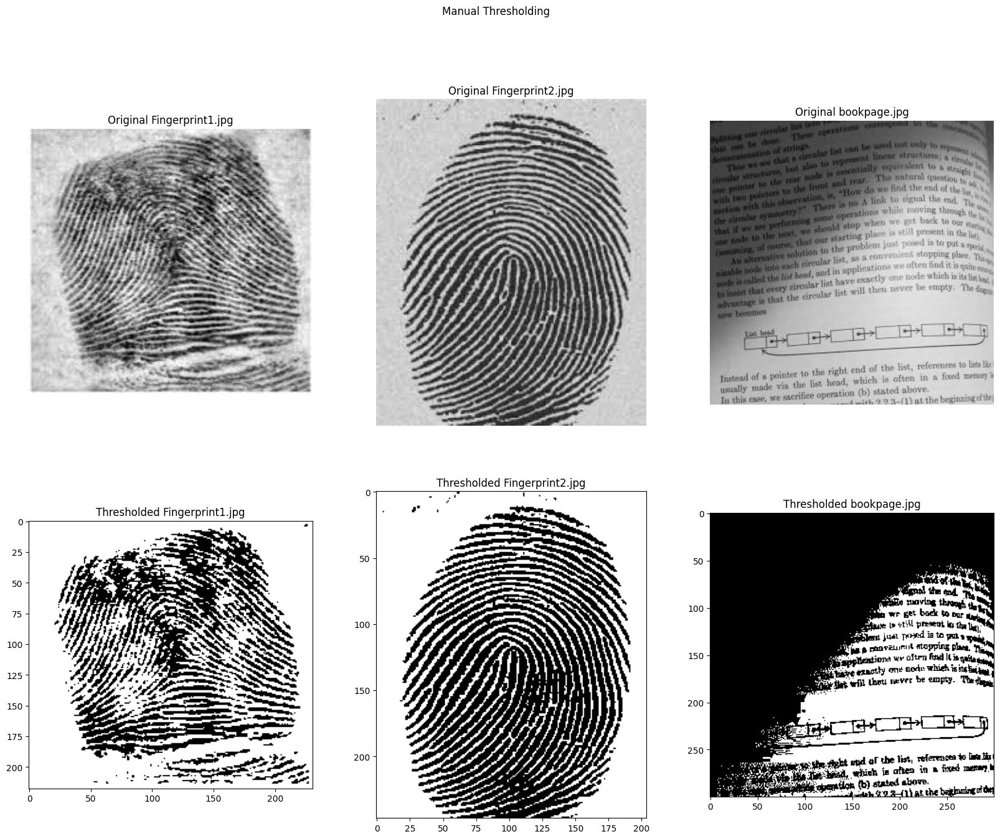

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 3, 1)
plt.suptitle("Manual Thresholding")
plt.imshow(fp_img1,cmap="gray")
plt.title("Original Fingerprint1.jpg")
plt.axis('off')
fig.add_subplot(2, 3, 2)
plt.imshow(fp_img2,cmap="gray")
plt.title("Original Fingerprint2.jpg")
plt.axis('off')
fig.add_subplot(2, 3, 3)
plt.imshow(bp_img,cmap="gray")
plt.title("Original bookpage.jpg")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(img_thresh[0], cmap="gray")
plt.title("Thresholded Fingerprint1.jpg")
fig.add_subplot(2,3,5)
plt.imshow(img_thresh[1], cmap="gray")
plt.title("Thresholded Fingerprint2.jpg")
fig.add_subplot(2,3,6)
plt.imshow(img_thresh[2],cmap="gray")
plt.title("Thresholded bookpage.jpg")
plt.show()

### b)

In [ ]:
def global_thresh(img,t):
  thresh=[]
  for i in range(3):
    thresh.append(cv2.threshold(img[i], t[i], 255, cv2.THRESH_BINARY)[1])
  return thresh

In [ ]:
img_thresh=global_thresh([fp_img1,fp_img2,bp_img],[150,120,100])

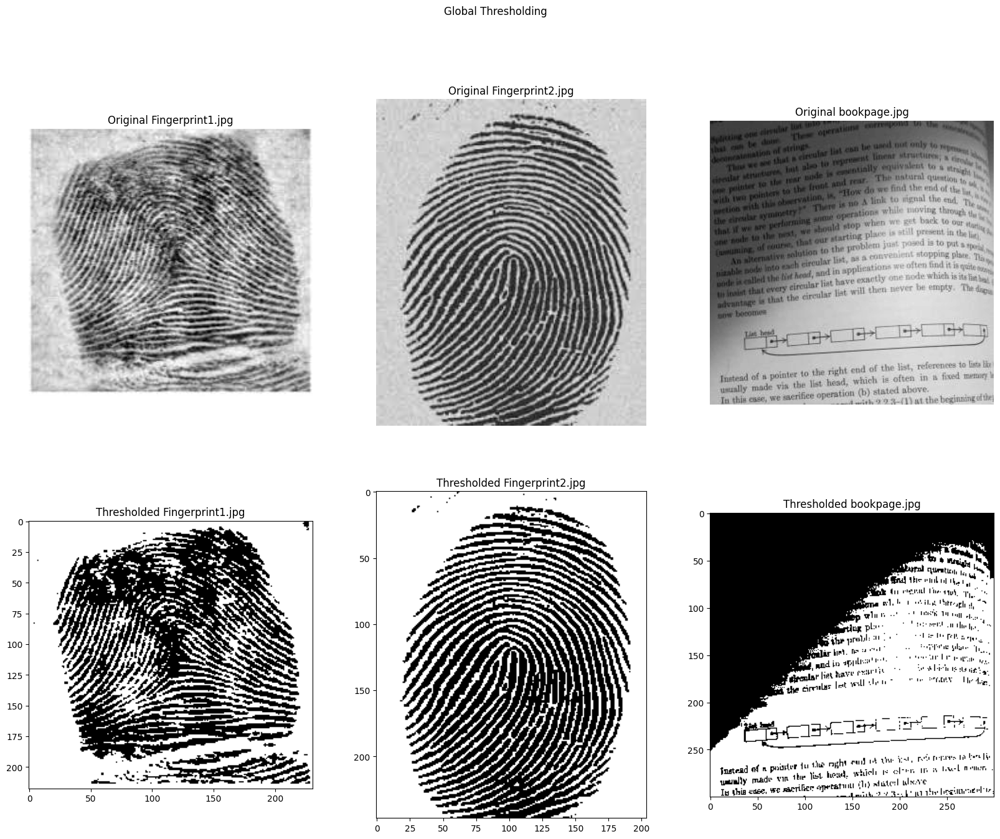

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 3, 1)
plt.suptitle("Global Thresholding")
plt.imshow(fp_img1,cmap="gray")
plt.title("Original Fingerprint1.jpg")
plt.axis('off')
fig.add_subplot(2, 3, 2)
plt.imshow(fp_img2,cmap="gray")
plt.title("Original Fingerprint2.jpg")
plt.axis('off')
fig.add_subplot(2, 3, 3)
plt.imshow(bp_img,cmap="gray")
plt.title("Original bookpage.jpg")
plt.axis('off')
fig.add_subplot(2,3,4)
plt.imshow(img_thresh[0], cmap="gray")
plt.title("Thresholded Fingerprint1.jpg")
fig.add_subplot(2,3,5)
plt.imshow(img_thresh[1], cmap="gray")
plt.title("Thresholded Fingerprint2.jpg")
fig.add_subplot(2,3,6)
plt.imshow(img_thresh[2],cmap="gray")
plt.title("Thresholded bookpage.jpg")
plt.show()

### c)

In [ ]:
def otsu_thresh(img):
  thresh=[]
  for i in range(3):
    thresh.append(cv2.threshold(img[i], 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1])
    blur = cv2.GaussianBlur(img[i],(5,5),0)
    thresh.append(cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1])
  return thresh

In [ ]:
img_thresh=otsu_thresh([fp_img1,fp_img2,bp_img])

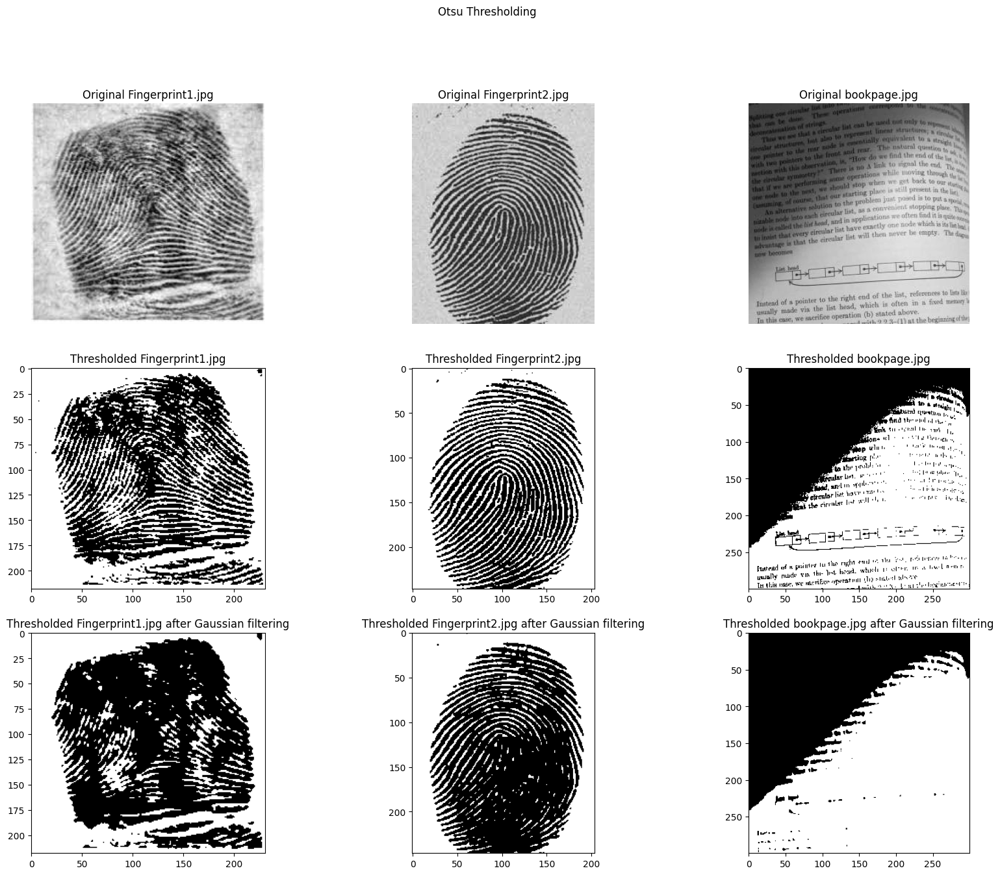

In [ ]:
fig=plt.figure()

fig.add_subplot(3, 3, 1)
plt.suptitle("Otsu Thresholding")
plt.imshow(fp_img1,cmap="gray")
plt.title("Original Fingerprint1.jpg")
plt.axis('off')
fig.add_subplot(3, 3, 2)
plt.imshow(fp_img2,cmap="gray")
plt.title("Original Fingerprint2.jpg")
plt.axis('off')
fig.add_subplot(3, 3, 3)
plt.imshow(bp_img,cmap="gray")
plt.title("Original bookpage.jpg")
plt.axis('off')
fig.add_subplot(3,3,4)
plt.imshow(img_thresh[0], cmap="gray")
plt.title("Thresholded Fingerprint1.jpg")
fig.add_subplot(3,3,5)
plt.imshow(img_thresh[2], cmap="gray")
plt.title("Thresholded Fingerprint2.jpg")
fig.add_subplot(3,3,6)
plt.imshow(img_thresh[4],cmap="gray")
plt.title("Thresholded bookpage.jpg")
fig.add_subplot(3,3,7)
plt.imshow(img_thresh[1], cmap="gray")
plt.title("Thresholded Fingerprint1.jpg after Gaussian filtering")
fig.add_subplot(3,3,8)
plt.imshow(img_thresh[3], cmap="gray")
plt.title("Thresholded Fingerprint2.jpg after Gaussian filtering")
fig.add_subplot(3,3,9)
plt.imshow(img_thresh[5],cmap="gray")
plt.title("Thresholded bookpage.jpg after Gaussian filtering")
plt.show()

From the above result we obsevre that applying Otsu's method on original image is working better than applying the same on the Gaussian filtered image.

### d)

In [ ]:
def adap_thresh(img):
  thresh=[]
  for i in range(3):
    thresh.append(cv2.adaptiveThreshold(img[i],255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2))
    thresh.append(cv2.adaptiveThreshold(img[i],255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2))
  return thresh  

In [ ]:
img_thresh=adap_thresh([fp_img1,fp_img2,bp_img])

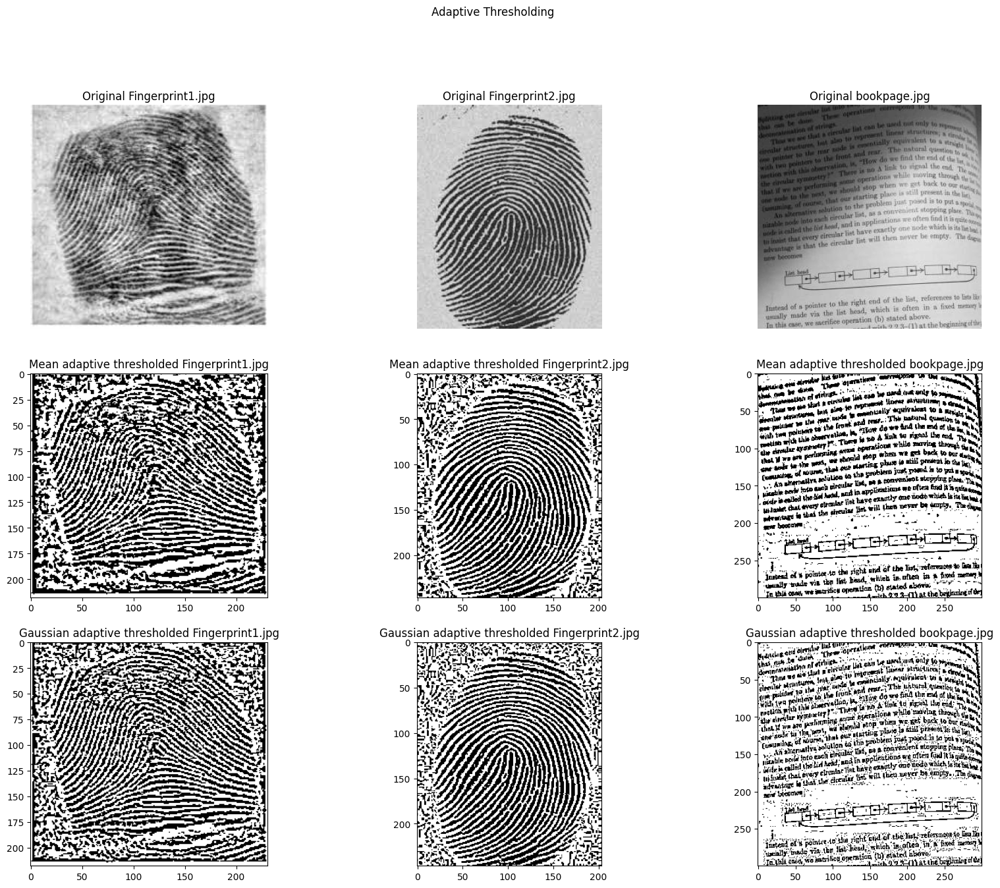

In [ ]:
fig=plt.figure()

fig.add_subplot(3, 3, 1)
plt.suptitle("Adaptive Thresholding")
plt.imshow(fp_img1,cmap="gray")
plt.title("Original Fingerprint1.jpg")
plt.axis('off')
fig.add_subplot(3, 3, 2)
plt.imshow(fp_img2,cmap="gray")
plt.title("Original Fingerprint2.jpg")
plt.axis('off')
fig.add_subplot(3, 3, 3)
plt.imshow(bp_img,cmap="gray")
plt.title("Original bookpage.jpg")
plt.axis('off')
fig.add_subplot(3,3,4)
plt.imshow(img_thresh[0], cmap="gray")
plt.title("Mean adaptive thresholded Fingerprint1.jpg")
fig.add_subplot(3,3,5)
plt.imshow(img_thresh[2], cmap="gray")
plt.title("Mean adaptive thresholded Fingerprint2.jpg")
fig.add_subplot(3,3,6)
plt.imshow(img_thresh[4],cmap="gray")
plt.title("Mean adaptive thresholded bookpage.jpg")
fig.add_subplot(3,3,7)
plt.imshow(img_thresh[1], cmap="gray")
plt.title("Gaussian adaptive thresholded Fingerprint1.jpg")
fig.add_subplot(3,3,8)
plt.imshow(img_thresh[3], cmap="gray")
plt.title("Gaussian adaptive thresholded Fingerprint2.jpg")
fig.add_subplot(3,3,9)
plt.imshow(img_thresh[5],cmap="gray")
plt.title("Gaussian adaptive thresholded bookpage.jpg")
plt.show()

From the above results we conclude that for the images fingerprint1.jpg and fingerprint2.jpg, global thresholding method and Otsu's method have worked better than adaptive thresholding methods, with Otsu's method providing slightly better results than global thresholding. This may be due to the fact that in case of global thresholding, we had set a threshold value manually ourselves, whereas on the contrary, in Otsu's method we measure the effectiveness of thresholding using the ratio of variances.

On the other hand, for the image bookpage.jpg, the adaptive thresolding methods (both mean and Gaussian) is working better than the rest of the methods we applied. Visually judging, we can conclude that mean-adaptive thresholding is working slighly better than the Gaussian alternative by removing more noise.

## 3)

In [ ]:
img=cv2.imread("building.jpg",0)

### a)

In [ ]:
# Applying Sobel filter
def app_sob(img):
  sobel_x = cv2.flip(np.array([[-1,0,1],[-2,0,2],[-1,0,1]]), -1)
  sobel_y = cv2.flip(np.array([[-1,-2,-1],[0,0,0],[1,2,1]]), -1)
  sob_x = cv2.filter2D(img, -1, sobel_x)
  sob_y = cv2.filter2D(img, -1, sobel_y)
  return (0.5* sob_x) + (0.5*sob_y)

In [ ]:
# Thresholding image
def app_threshold(img, threshold=25):
  M,N = img.shape
  output = np.zeros((M,N))
  for i in range(M):
    for j in range(N):
      if img[i,j]>threshold:
        output[i,j] = 255
  return output

In [ ]:
img_noise_rem = cv2.GaussianBlur(img, (3, 3), 1.5)

# Applying sobel filter
sob_img = app_sob(img)
sob_img_noise_rem = app_sob(img_noise_rem)
sob_img_threshold = app_threshold(sob_img_noise_rem)

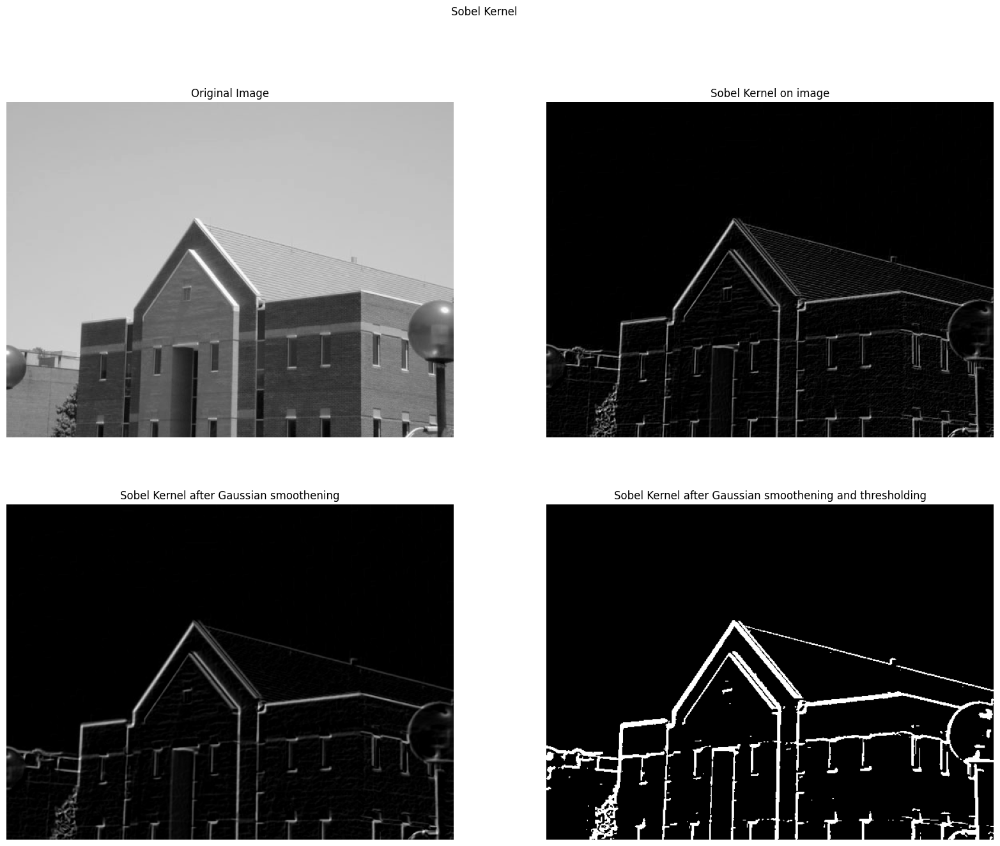

In [ ]:
fig=plt.figure()

fig.add_subplot(2, 2, 1)
plt.suptitle("Sobel Kernel")
plt.imshow(img,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(2, 2, 2)
plt.imshow(sob_img,cmap="gray")
plt.title("Sobel Kernel on image")
plt.axis('off')
fig.add_subplot(2, 2, 3)
plt.imshow(sob_img_noise_rem,cmap="gray")
plt.title("Sobel Kernel after Gaussian smoothening")
plt.axis('off')
fig.add_subplot(2, 2, 4)
plt.imshow(sob_img_threshold,cmap="gray")
plt.title("Sobel Kernel after Gaussian smoothening and thresholding")
plt.axis('off')
plt.show()

### b)

In [ ]:
# Applying LoG filtering
def app_log(img):
  img_den = cv2.GaussianBlur(img, (3, 3), 1.5)
  return cv2.Laplacian(img_den, cv2.CV_64F)

In [ ]:
# Applying zero-crossing
def zero_crossing(image):
  z_c_image = np.zeros(image.shape)

  '''  
  For each pixel, count the number of positive
  and negative pixels in the neighborhood
  '''
  for i in range(1, image.shape[0] - 1):
    for j in range(1, image.shape[1] - 1):
      neg, pos = 0, 0
      neighbour = [image[i+1, j-1],image[i+1, j],image[i+1, j+1],image[i, j-1],image[i, j+1],image[i-1, j-1],image[i-1, j],image[i-1, j+1]]
      d, e = max(neighbour), min(neighbour)
      for h in neighbour:
        if h>0:
          pos += 1
        elif h<0:
          neg += 1

      '''
       If both negative and positive values exist in 
       the pixel neighborhood, then that pixel is a 
       potential zero crossing
      '''
            
      z_c = ((neg > 0) and (pos > 0))
      '''
       Change the pixel value with the maximum neighborhood
       difference with the pixel
      '''

      if z_c:
        if image[i,j]>0:
          z_c_image[i, j] = image[i,j] + np.abs(e)
        elif image[i,j]<0:
          z_c_image[i, j] = np.abs(image[i,j]) + d
                
  # Normalize and change datatype to 'uint8' (optional)
  z_c_norm = z_c_image/z_c_image.max()*255
  z_c_image = np.uint8(z_c_norm)
  return z_c_image

In [ ]:
# Applying LoG
log_img = app_log(img)

# Applying zero-crossing
zc_log = zero_crossing(log_img)

# Applying thresholding
zc_log = app_threshold(zc_log, threshold = 35)

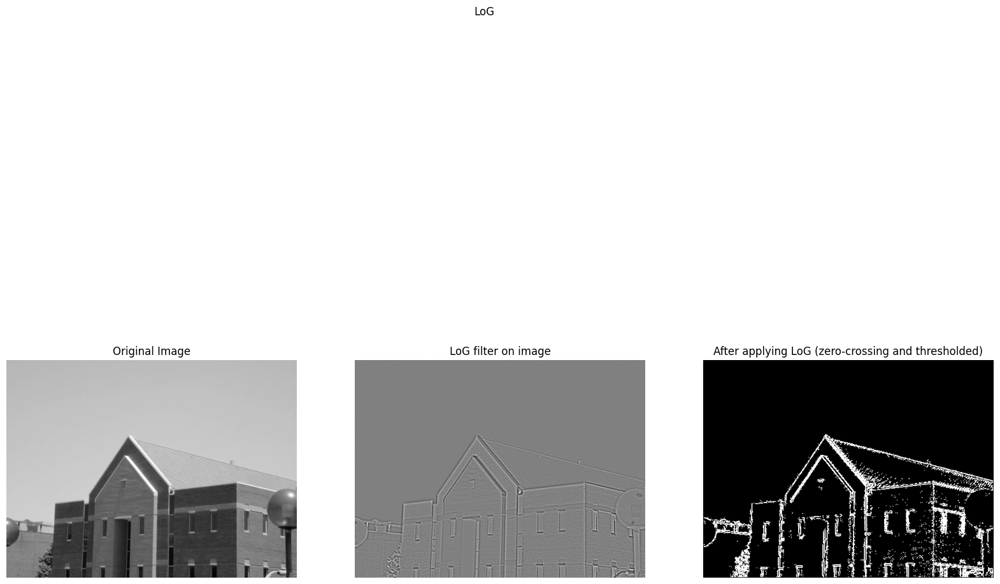

In [ ]:
fig=plt.figure()

fig.add_subplot(1, 3, 1)
plt.suptitle("LoG")
plt.imshow(img,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(1, 3, 2)
plt.imshow(log_img,cmap="gray")
plt.title("LoG filter on image")
plt.axis('off')
fig.add_subplot(1, 3, 3)
plt.imshow(zc_log,cmap="gray")
plt.title("After applying LoG (zero-crossing and thresholded)")
plt.axis('off')
plt.show()

### c)

In [ ]:
# Canny edge detection
smooth = cv2.GaussianBlur(img, (3,3), 1.5)
canny = cv2.Canny(img, 40, 150)

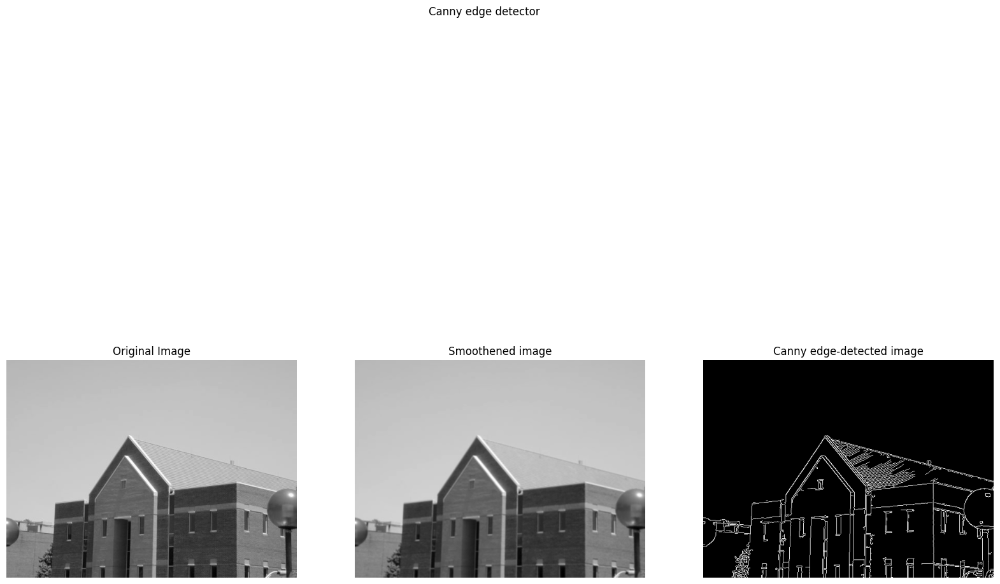

In [ ]:
fig=plt.figure()

fig.add_subplot(1, 3, 1)
plt.suptitle("Canny edge detector")
plt.imshow(img,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(1, 3, 2)
plt.imshow(smooth,cmap="gray")
plt.title("Smoothened image")
plt.axis('off')
fig.add_subplot(1, 3, 3)
plt.imshow(canny,cmap="gray")
plt.title("Canny edge-detected image")
plt.axis('off')
plt.show()

### d)

In [ ]:
# Hough Transform
hough_image = cv2.GaussianBlur(img, (3,3), 1.5)
edges = cv2.Canny(hough_image, 50, 200, apertureSize = 3)
lines = cv2.HoughLinesP(edges, 2, np.pi/180, threshold = 150, minLineLength=100,maxLineGap=250)

In [ ]:
# Draw lines on the image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(hough_image, (x1, y1), (x2, y2), (255, 0, 0), 3)

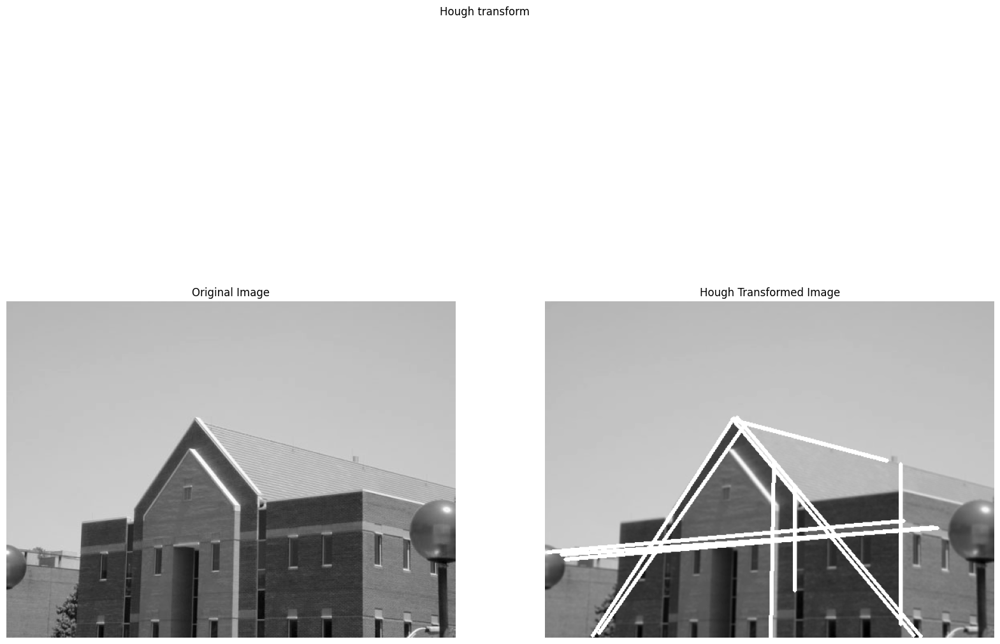

In [ ]:
fig=plt.figure()

fig.add_subplot(1, 2, 1)
plt.suptitle("Hough transform")
plt.imshow(img,cmap="gray")
plt.title("Original Image")
plt.axis('off')
fig.add_subplot(1, 2, 2)
plt.imshow(hough_image,cmap="gray")
plt.title("Hough Transformed Image")
plt.axis('off')
plt.show()

### Comparison with objects.png

In [ ]:
img2=cv2.imread('objects.png',0)

In [ ]:
# Gaussian Smooothening
img_noise_rem2 = cv2.GaussianBlur(img2, (3, 3), 1.5)

# Applying sobel filter
sob_img2 = app_sob(img2)
sob_img_noise_rem2 = app_sob(img_noise_rem2)
sob_img_threshold2 = app_threshold(sob_img_noise_rem2)

# Applying LoG
log_img2 = app_log(img2)
# Applying zero-crossing
zc_log2 = zero_crossing(log_img2)
# Applying thresholding
zc_log2 = app_threshold(zc_log2, threshold = 35)

# Canny edge detection
smooth2 = cv2.GaussianBlur(img2, (3,3), 1.5)
canny2 = cv2.Canny(img2, 40, 150)


# Hough Transform
hough_image2 = cv2.GaussianBlur(img2, (3,3), 1.5)
edges2 = cv2.Canny(hough_image2, 50, 200, apertureSize = 3)
lines2 = cv2.HoughLinesP(edges2, 2, np.pi/180, threshold = 150, minLineLength=100, 
                        maxLineGap=250)

# Draw lines on the image
for line in lines2:
    x1, y1, x2, y2 = line[0]
    cv2.line(hough_image2, (x1, y1), (x2, y2), (255, 0, 0), 3)

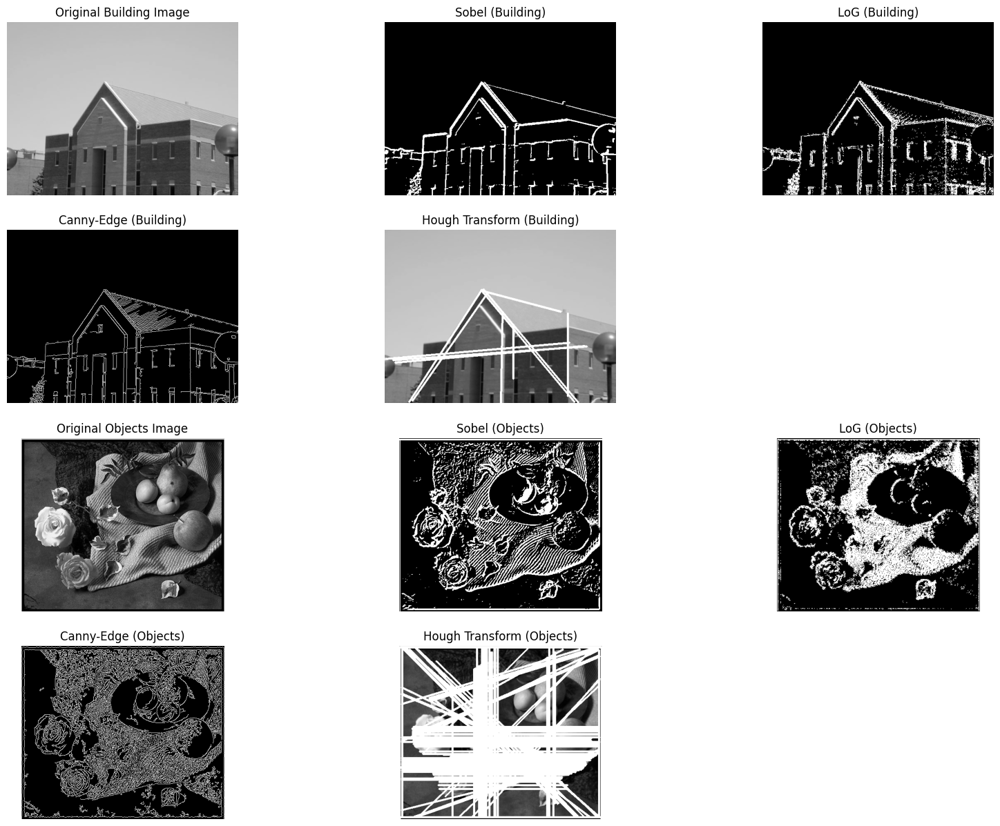

In [ ]:
fig=plt.figure()

fig.add_subplot(4, 3, 1)
plt.imshow(img,cmap="gray")
plt.title("Original Building Image")
plt.axis('off')
fig.add_subplot(4, 3, 2)
plt.imshow(sob_img_threshold,cmap="gray")
plt.title("Sobel (Building)")
plt.axis('off')
fig.add_subplot(4, 3, 3)
plt.imshow(zc_log,cmap="gray")
plt.title("LoG (Building)")
plt.axis('off')
fig.add_subplot(4, 3, 4)
plt.imshow(canny,cmap="gray")
plt.title("Canny-Edge (Building)")
plt.axis('off')
fig.add_subplot(4, 3, 5)
plt.imshow(hough_image,cmap="gray")
plt.title("Hough Transform (Building)")
plt.axis('off')
fig.add_subplot(4, 3, 7)
plt.imshow(img2,cmap="gray")
plt.title("Original Objects Image")
plt.axis('off')
fig.add_subplot(4, 3, 8)
plt.imshow(sob_img_threshold2,cmap="gray")
plt.title("Sobel (Objects)")
plt.axis('off')
fig.add_subplot(4, 3, 9)
plt.imshow(zc_log2,cmap="gray")
plt.title("LoG (Objects)")
plt.axis('off')
fig.add_subplot(4, 3, 10)
plt.imshow(canny2,cmap="gray")
plt.title("Canny-Edge (Objects)")
plt.axis('off')
fig.add_subplot(4, 3, 11)
plt.imshow(hough_image2,cmap="gray")
plt.title("Hough Transform (Objects)")
plt.axis('off')
plt.show()

By visual comparison we immediately conclude that Canny Edge Detection works the best for building.jpg. From the above results we also observe that for building.jpg, Hough transform has been able to detect the lines since the image has very well-defined straight lines.

On the other hand, for the image objects.png, Hough transform fails terribly in edge-detection since the image contains mostly circular and curved objects with non-linear edges. For such an image we may implement the method described below (Hough transform for circular edge detection):

In [ ]:
# Hough transform to detect circular edges
circles = cv2.HoughCircles(img_noise_rem2, cv2.HOUGH_GRADIENT, 1, 20,
                            param1=50, param2=30, minRadius=10, maxRadius=25)
circles = np.uint16(np.around(circles))
for i in circles[0,:]:
  # draw the outer circle
  cv2.circle(img_noise_rem2, (i[0],i[1]), i[2], (0,255,0), 2)
  # draw the center of the circle
  cv2.circle(img_noise_rem2, (i[0],i[1]), 2, (0,0,255), 3)

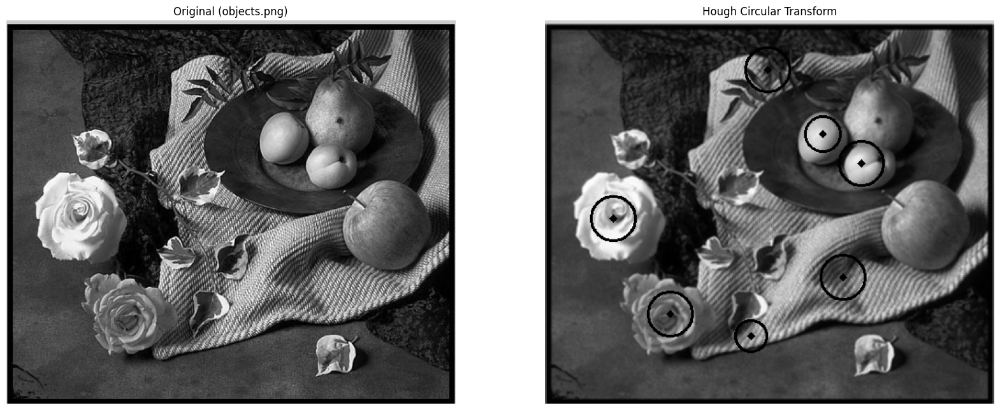

In [ ]:
fig=plt.figure()

fig.add_subplot(1, 2, 1)
plt.imshow(img2,cmap="gray")
plt.title("Original (objects.png)")
plt.axis('off')
fig.add_subplot(1, 2, 2)
plt.imshow(img_noise_rem2,cmap="gray")
plt.title("Hough Circular Transform")
plt.axis('off')
plt.show()